In [1]:
import numpy as np
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
from wave_prop_module import Wave2d
from torch import optim
from unet import UNet
from loss_fns import *

In [28]:
model = UNet(num_input_channels=1, num_output_channels=1) # postprocessor

# complete model
device = torch.device('cuda:0')

# incident wave
X, Y = np.meshgrid(np.linspace(-1, 1, 1024), np.linspace(-1, 1, 1360))

A = torch.tensor([X.T.ravel(), Y.T.ravel(), X.T.ravel()*Y.T.ravel(), X.T.ravel()*X.T.ravel(), Y.T.ravel()*Y.T.ravel(), np.ones_like(X.T.ravel()), 
              (X.T.ravel())**3, (Y.T.ravel())**3, X.T.ravel()*(Y.T.ravel())**2, Y.T.ravel()*(X.T.ravel())**2], dtype=torch.float32).T


# coeffs = torch.rand(10, 1, requires_grad=True)
coeffs = torch.FloatTensor(10, 1).uniform_(-1, 1)
# coeffs = torch.tensor([[ -13.53],
#         [-113.3250],
#         [ -12.7425],
#         [   4.4154],
#         [   6.2158],
#         [ -119.261],
#         [   2.3329],
#         [  1.3617],
#         [   1.5364],
#         [  3.5796]])
coeffs.requires_grad=True

# obj_amp = torch.rand(1024, 1360, requires_grad=True)
obj_phase = torch.rand(1024, 1360, requires_grad=True)
obj_amp = torch.rand(1024, 1360, requires_grad=True)

phase_img = np.load('phase_0.npy')
abs_img = np.load('abs_0.npy')

target_phase = torch.tensor(phase_img).T
target_abs = torch.tensor(abs_img).T

cons = torch.tensor(3.2, requires_grad=True)
# dist = torch.tensor(145.003) # mm 


optimizer = optim.Adam([
    {'params': obj_phase, 'lr': 1e-1},
    {'params': obj_amp, 'lr': 1e-1},
    {'params': coeffs, 'lr': 10},
    {'params': cons, 'lr': 1e-2},
    # {'params': dist, 'lr': 1e-2}
    ],
    lr=0.01, betas=(0.9, 0.999)
    )
optimizer_proc = optim.Adam([
    {'params': model.parameters(), 'lr': 2e-2}],
    lr=0.01, betas=(0.9, 0.999)
    )

wave_obj = Wave2d(
        numPx = list(obj_phase.shape), 
        sizePx = [6*1e-3, 6*1e-3], 
        wl = 550*1e-6
        )

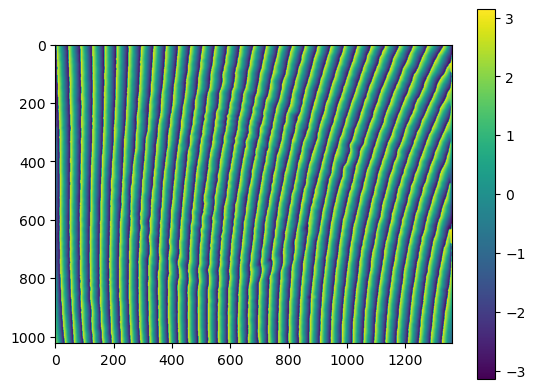

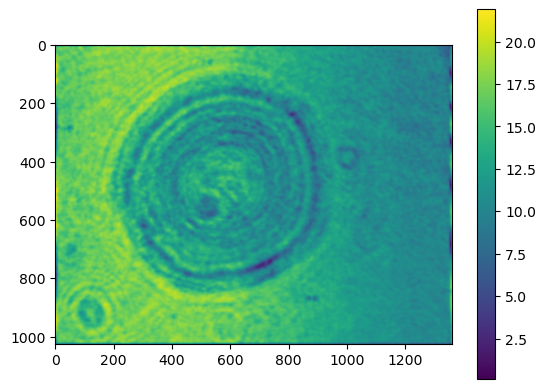

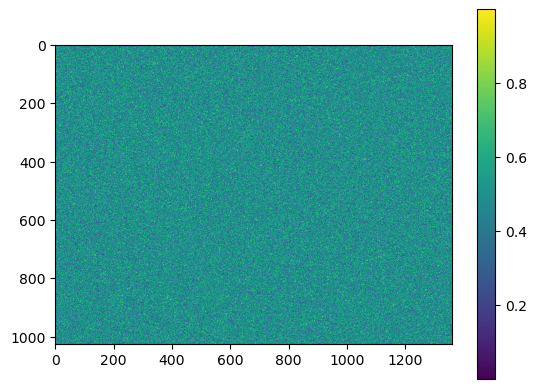

In [29]:
plt.imshow(target_phase.T)
plt.colorbar()
plt.show()

plt.imshow(target_abs.T)
plt.colorbar()
plt.show()

plt.imshow(obj_phase.detach())
plt.colorbar()
plt.show()

0 0.5923577316075379


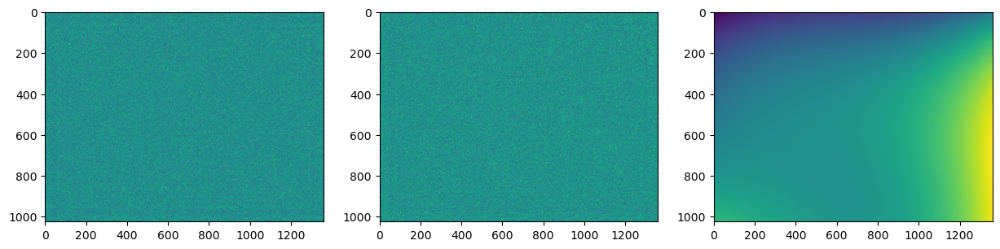

1 0.4764264538866078
2 0.3948784235971228
3 0.40083913853263464
4 0.4064264748094508
5 0.3887141286638758
6 0.36820018114915837
7 0.3503742508448668
8 0.3359445981085044
9 0.3235606245945801
10 0.3186180414412805
11 0.30906567565587817
12 0.30068585143575094
13 0.29756145233511977
14 0.2903775478657376
15 0.2830961991671503
16 0.2790214995658865
17 0.2765620898699459
18 0.27049056346070194
19 0.26511094252255396
20 0.26168295052758345
21 0.2589679504994335
22 0.2532641330331482
23 0.24955252135663844
24 0.24528475582937595
25 0.24197200564337368


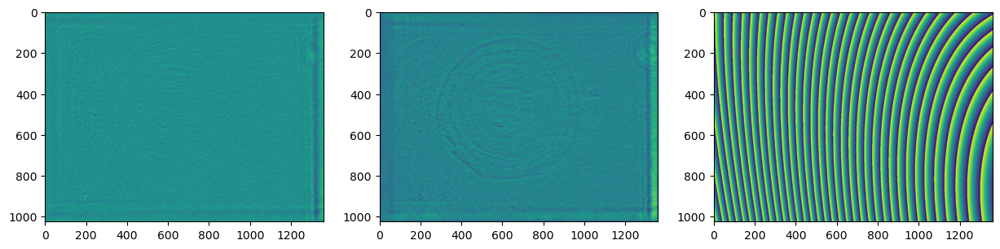

26 0.24555723926399375
27 0.23786178653698178
28 0.23800711771727445
29 0.23217986695359566
30 0.23437409708179724
31 0.2265068951804169
32 0.2307267035357003
33 0.22274410634909048
34 0.22578975846051327
35 0.22159607715418256
36 0.22094502977502056
37 0.22053094254201983
38 0.21675092689525577
39 0.21353902508368838
40 0.21950263298242245
41 0.21069492397714917
42 0.2143930544917402
43 0.20802328688905022
44 0.21284148968951416
45 0.206912864473766
46 0.20821715695657894
47 0.20614795548069864
48 0.20885374195806466
49 0.20701701492047433
50 0.2007552042754724


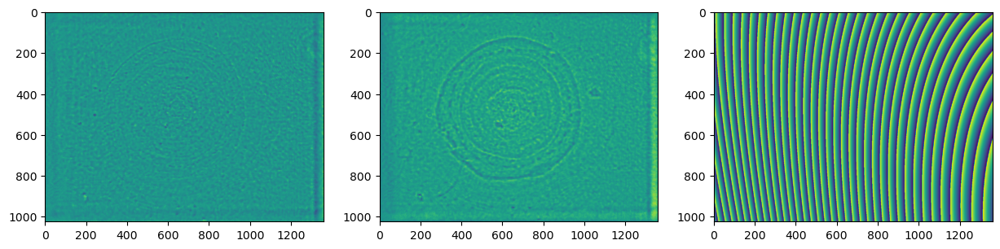

51 0.20166582690899124
52 0.20979159511255627
53 0.20256908831734588
54 0.1976523627461012
55 0.20016725336291072
56 0.19858827873169388
57 0.19521659482562298
58 0.19220260863053312
59 0.1925140210315539
60 0.20447273260476218
61 0.19240354056498205
62 0.20476679371379924
63 0.19182657010384596
64 0.20155090350688346
65 0.19457941401412
66 0.19368507578177305
67 0.19781564251626382
68 0.19259232237887025
69 0.19441932193001882
70 0.19007016781616884
71 0.19551813301707746
72 0.19035027978708888
73 0.1930884706769898
74 0.19196060144092236
75 0.19366415906649978


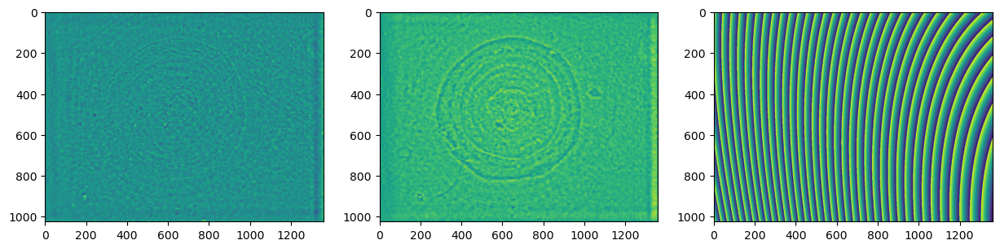

76 0.19120735392412225
77 0.18958717255266383
78 0.18746026857808187
79 0.18910880408961805
80 0.1866227468545584
81 0.1939700658279213
82 0.18748116043550042
83 0.18618288155303958
84 0.18199917648365488
85 0.18448967895277402
86 0.18683288199263254
87 0.18967985877479024
88 0.18557938659786344
89 0.18398517731622172
90 0.18068029285033727
91 0.18494728842051786
92 0.1851044460377128
93 0.17910179306312968
94 0.17684443991194415
95 0.1795578912915401
96 0.18075892647454234
97 0.18292607748709477
98 0.17949771732768616
99 0.17870835028706805
100 0.1769799921836157


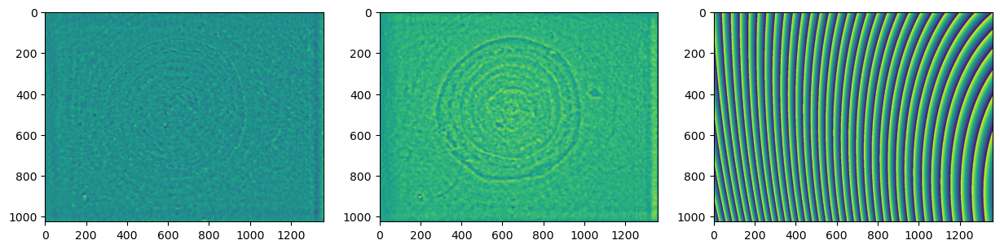

101 0.17798622058711425
102 0.17991248167305762
103 0.175799853630753
104 0.17649012323335717
105 0.17896655924901753
106 0.1777329908805796
107 0.1724142958957225
108 0.17473246641917317
109 0.18035593314477152
110 0.1734384123518003
111 0.17531962354354008
112 0.17999829026729833
113 0.17233904757521443
114 0.1717805550383139
115 0.17776601093185734
116 0.17461642673864713
117 0.17466955973832524
118 0.17789439871531884
119 0.17021301057045757
120 0.1722678875521097
121 0.18168770024233658
122 0.17435005548277532
123 0.18115962311582345
124 0.1733931751007593
125 0.17946814948814852


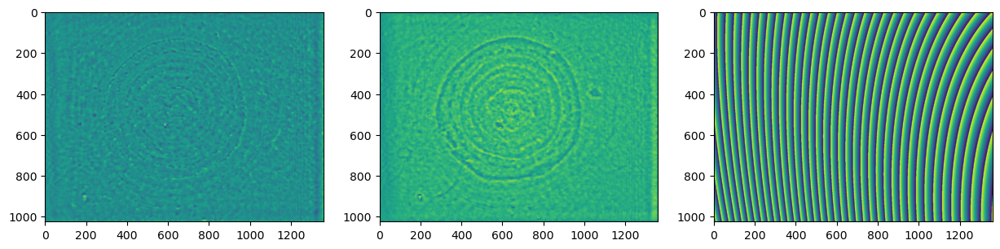

126 0.1749911588658588
127 0.17358746918750223
128 0.17874661073833095
129 0.1700132922706021
130 0.1756272611938416
131 0.1713011277596439
132 0.1694553474288713
133 0.173022794716214
134 0.17341272765459434
135 0.17686624870407902
136 0.17005795351436953
137 0.1678085007343469
138 0.17047625429989557
139 0.1692887004483098
140 0.1693760493626193
141 0.1697641013041064
142 0.16786442611312852
143 0.16797027566598524
144 0.1693597534666001
145 0.16972796615284358
146 0.1731877090454663
147 0.16675287430429758
148 0.16526477442781778
149 0.16789676896792755
150 0.1645105925155349


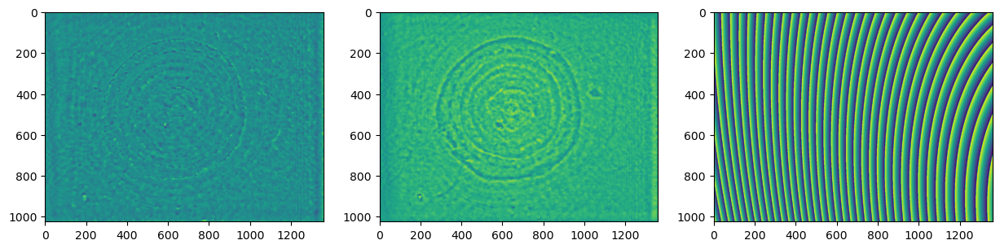

151 0.1639047346215068
152 0.16684575065002433
153 0.17231484601205796
154 0.16932962658155937
155 0.16447522982035795
156 0.16170528658254113
157 0.1638306222683535
158 0.16849275599099708
159 0.1697364516558508
160 0.1656001420878697
161 0.16575807563061132
162 0.1681331343605146
163 0.16158537583090637
164 0.16084692823923874
165 0.1682112335228391
166 0.17024595982087504
167 0.164666902106797
168 0.16167272895590806
169 0.16152785370072714
170 0.16384781103006188
171 0.16071444922706782
172 0.16257268947399597
173 0.17044723475999812
174 0.16361341289482362
175 0.15875428084467377


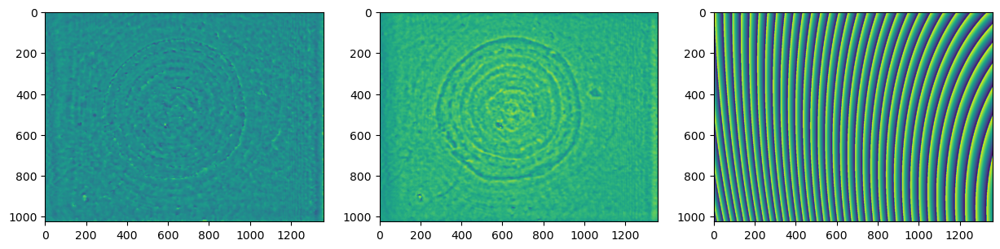

176 0.15900875756651003
177 0.1625263145898613
178 0.1673318555496216
179 0.16238886145727854
180 0.1622593068544267
181 0.16724063694457697
182 0.15924637264803704
183 0.16004846364044845
184 0.1683578984914571
185 0.161002199288548
186 0.16195227699708747
187 0.16945949978859043
188 0.1598005288165618
189 0.16462851004465875
190 0.165833439644748
191 0.16013866076700783
192 0.1657872709595386
193 0.16352653378288148
194 0.16173138072910984
195 0.16461070900579375
196 0.15952587956035524
197 0.16156820029346147
198 0.16098570119470842
199 0.15954241566793675
200 0.1610942391997642


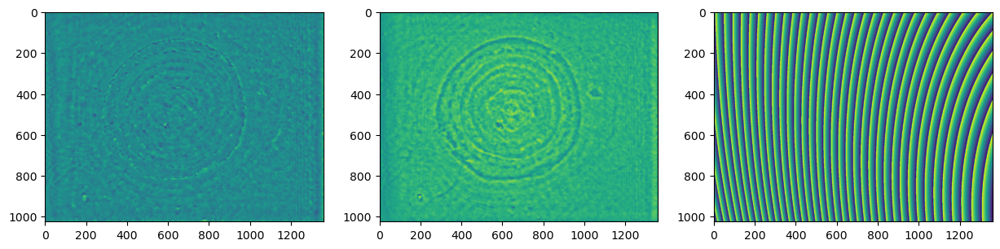

201 0.16368326465835936
202 0.16016297436664229
203 0.16108841250046277
204 0.1583560189586655
205 0.15714805170275592
206 0.15751918475898177
207 0.16183907986587545
208 0.15929716883698006
209 0.15917863256670853
210 0.1605203042193507
211 0.1613256895404469
212 0.16008902795670432
213 0.16047475431961308
214 0.15782991265489243
215 0.15595770766679035
216 0.15722929573228178
217 0.1576021781281498
218 0.15766736939757978
219 0.16094850491358387
220 0.15755526653539398
221 0.15711741692922965
222 0.1598401361735925
223 0.15787116832341888
224 0.1588598328881929
225 0.16089151253131373


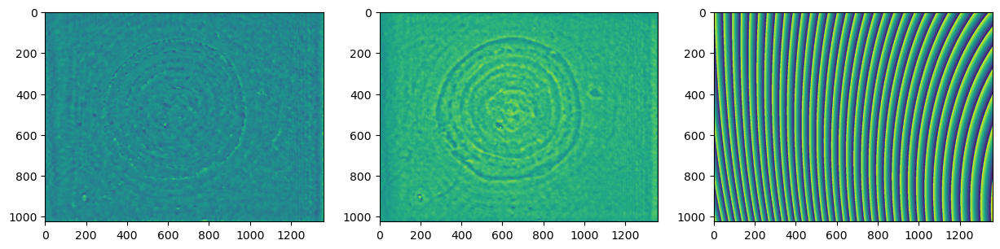

226 0.15577341458652408
227 0.15522213619437114
228 0.15676234458128555
229 0.15579806564988488
230 0.15737263903802282
231 0.15799991528925816
232 0.15621989631590535
233 0.1586290929346297
234 0.15773500100007415
235 0.15551856077984072
236 0.15634005844198512
237 0.15813134485952265
238 0.1539147185921939
239 0.153671578699575
240 0.15439251477108762
241 0.15618295179550717
242 0.1542854147989921
243 0.15199769144852876
244 0.15474954330809057
245 0.15760200986955578
246 0.16028984492437318
247 0.15562481164814707
248 0.15517073494967143
249 0.15808094210075802
250 0.15331782779636435


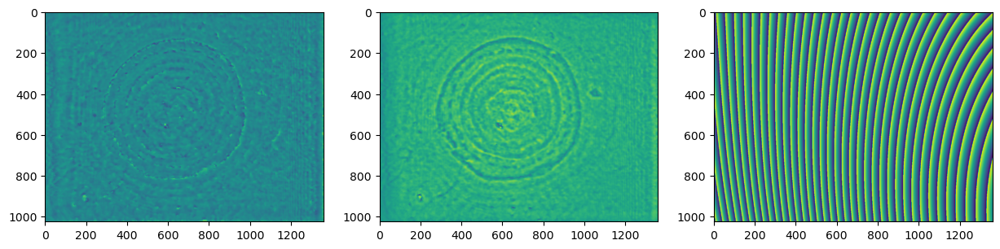

251 0.15185903233201503
252 0.15110951449263732
253 0.1532794692926418
254 0.1575016899965333
255 0.1556224818492586
256 0.1562792911970438
257 0.15302993487781502
258 0.1500594158212141
259 0.15297701761413335
260 0.15698530734315508
261 0.155555673641681
262 0.15272900778498877
263 0.1538656777233042
264 0.15738923585287393
265 0.15486997056838203
266 0.15285455639614962
267 0.15022562887559204
268 0.15369324331616221
269 0.15604395397111845
270 0.15756224426518584
271 0.15132087891321225
272 0.14916032786691572
273 0.14979468810864052
274 0.15082737701304533
275 0.15609851845406592


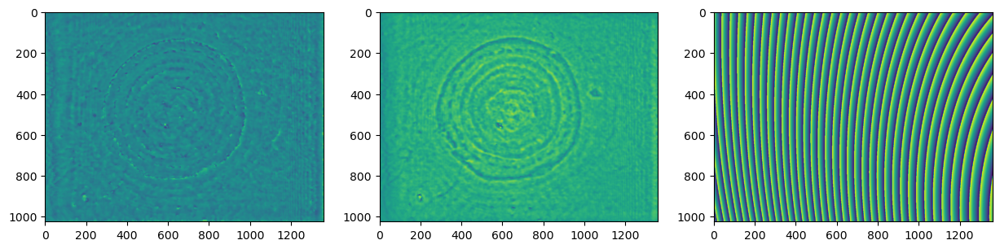

276 0.15317095361920338
277 0.1530446901151213
278 0.15395084432988787
279 0.15516648096349872
280 0.15594430990024535
281 0.15056507698288277
282 0.1494937394102876
283 0.15132524701120334
284 0.15087308526393078
285 0.15337624988388426
286 0.15005622322051643
287 0.14863782519034632
288 0.1487714771658138
289 0.15211384676094472
290 0.15235123379509333
291 0.15220272498582885
292 0.15757355720138236
293 0.15209176396947813
294 0.15040007316432935
295 0.15378127411494166
296 0.15195544931657617
297 0.15093220207292463
298 0.14912167721827718
299 0.14922509753525676
300 0.14751206364442795


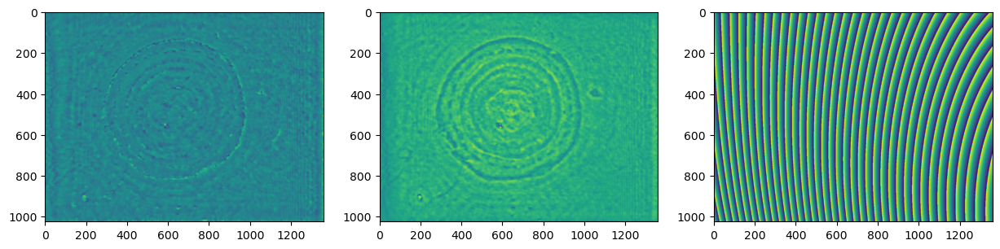

301 0.14815600649470587
302 0.15525392438383775
303 0.15352486927396755
304 0.15098438453873864
305 0.1488639888982587
306 0.15019084671882296
307 0.15469391239074803
308 0.1508525791179541
309 0.14761470389656664
310 0.14661834883530694
311 0.15083250332753487
312 0.15353598315859343
313 0.1528532604018729
314 0.14749551038864736
315 0.1511304807217264
316 0.15724877711927293
317 0.151128070516107
318 0.14704462011335157
319 0.14555855173579643
320 0.1487508427573942
321 0.1499108684614424
322 0.15161254631664348
323 0.14806369390516552
324 0.1495530777355335
325 0.1515739769968116


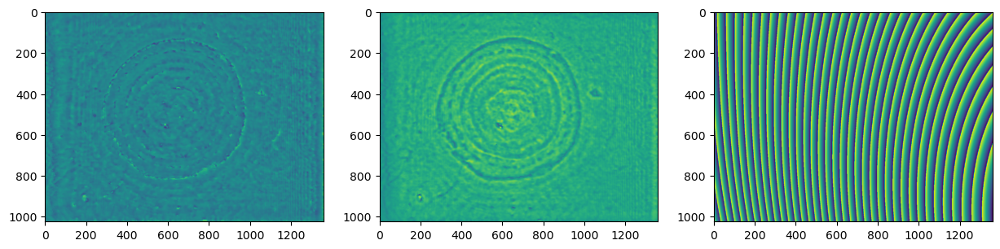

326 0.15026643869365236
327 0.1464428222463372
328 0.14665002475734126
329 0.15270559190801425
330 0.15448094336822846
331 0.14975272491992891
332 0.1463158823067903
333 0.14567401347815648
334 0.15030398256736058
335 0.14857357601376692
336 0.14834616602716788
337 0.14556356437971785
338 0.14900540578036983
339 0.15431830642820038
340 0.15063516165936838
341 0.14649446363583307
342 0.14544206113131455
343 0.14492098781071963
344 0.1466103622553442
345 0.1503732997936325
346 0.1518024145904191
347 0.14665312940776262
348 0.14594513202489118
349 0.15127454066006876
350 0.14637623822510956


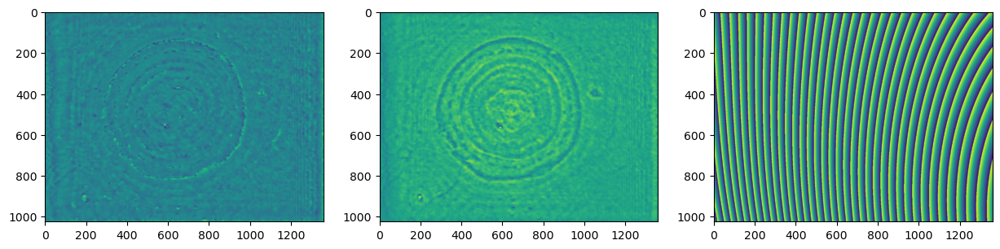

351 0.1457949984437274
352 0.14491939352978372
353 0.1467213894961884
354 0.15097043735074486
355 0.146300847348937
356 0.14616515609822375
357 0.1470206254747281
358 0.15224703288309507
359 0.14560951683394402
360 0.1427998909277244
361 0.14618906722842281
362 0.15307121628725628
363 0.15167494238219298
364 0.1479002839019159
365 0.14462637838553813
366 0.14434350284557085
367 0.15019479972047317
368 0.14687232039975087
369 0.14503346470742498
370 0.14503213650589752
371 0.1508763448601799
372 0.15277553729414495
373 0.14721040570628408
374 0.14380963121104343
375 0.14359349638254337


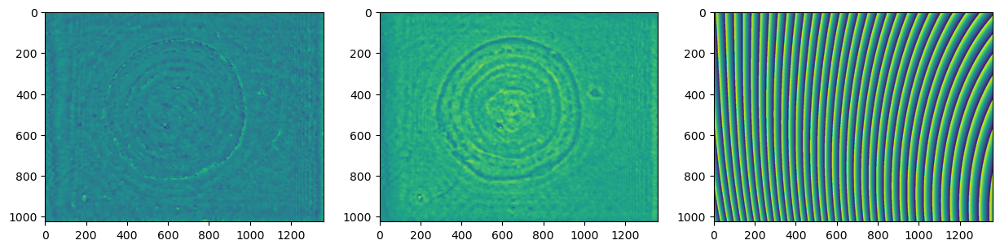

376 0.14768766832197006
377 0.14824021503628404
378 0.1477994156701725
379 0.1470006200173537
380 0.14651480423749444
381 0.14641594437341166
382 0.1453271678322913
383 0.14734074846617023
384 0.14388337799441142
385 0.14543255264950522
386 0.14619884096841307
387 0.15051046672128826
388 0.14913340010090062
389 0.14666793218667593
390 0.14493654870453102
391 0.14306584172164735
392 0.14320640869220977
393 0.1428936819206606
394 0.14505923407696297
395 0.1462202658734112
396 0.1480857374362069
397 0.1442559504531548
398 0.14541661580450693
399 0.14694011951363772
400 0.14345414987806077


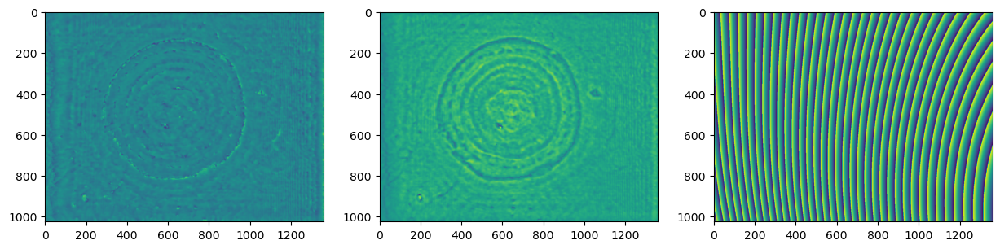

401 0.1444284964457711
402 0.1445088707010755
403 0.14552895503395236
404 0.1465666190602273
405 0.14821699366901497
406 0.1473451607309506
407 0.14536845445570573
408 0.14718347268455845
409 0.14428872609878574
410 0.1432579893776526
411 0.14113227647199045
412 0.1450456606637583
413 0.1509433624966776
414 0.14788731419783077
415 0.14208857612798487
416 0.14017366256374478
417 0.14055560634255532
418 0.14274710946930758
419 0.1484315657732909
420 0.1440089857610011
421 0.14278777696848768
422 0.1425146568593762
423 0.14723609254857747
424 0.1518748934153909
425 0.144246684755429


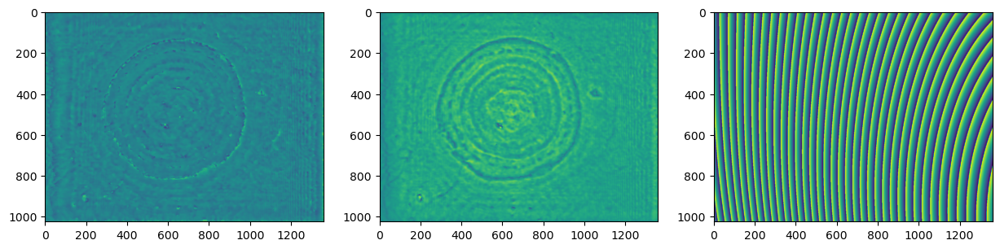

426 0.13937348523346982
427 0.13875148142311608
428 0.1416586045672977
429 0.14681524418589642
430 0.14688874186897977
431 0.1403274036428207
432 0.1398698377854546
433 0.14208246152050236
434 0.14523008790033629
435 0.15190076409827308
436 0.14420476920047087
437 0.1441142617999001
438 0.14538049674972958
439 0.1433040360687415
440 0.14454270665729108
441 0.14335787459356658
442 0.14297352489222317
443 0.14770527880919623
444 0.14522134760507716
445 0.14158227689833014
446 0.13978346504562816
447 0.14102494994916295
448 0.14549251663866253
449 0.14444603456226238
450 0.1445868756880536


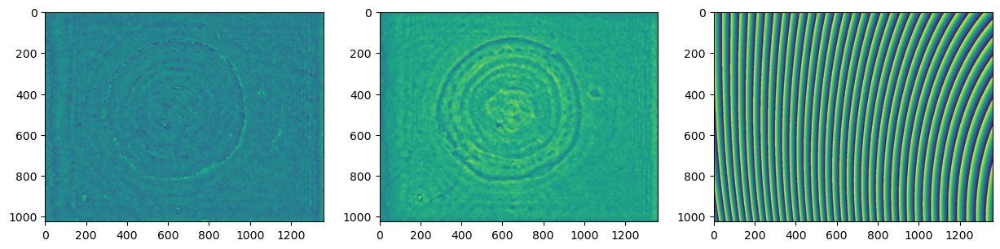

451 0.14278386193655926
452 0.14681120319936206
453 0.1468541271347171
454 0.14113282387555715
455 0.14018086848211952
456 0.141524490100012
457 0.14323098766440925
458 0.14552219327799987
459 0.14501397413525308
460 0.1457800200044925
461 0.13996475750791365
462 0.14037658197905215
463 0.14438835968738267
464 0.14551928879149154
465 0.14070718200865334
466 0.14139922372439906
467 0.14353803103601329
468 0.14790368521326186
469 0.1402100067400283
470 0.1388117666307365
471 0.14136481916354998
472 0.14405306384558603
473 0.14159885490196697
474 0.14094909523359167
475 0.14311589699328892


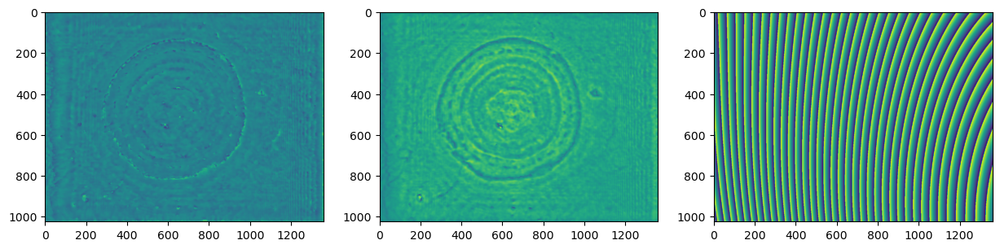

476 0.14876084061002703
477 0.14562607989365908
478 0.140833510778341
479 0.14468829205485312
480 0.1419801697354378
481 0.14213185237070658
482 0.14311687442862453
483 0.1464810761082248
484 0.1449157522431934
485 0.13998391165057358
486 0.1395575522361863
487 0.14407648576352008
488 0.14556601854759738
489 0.14217660477681995
490 0.13764193975858768
491 0.13789356497457378
492 0.14356820876897047
493 0.14921796730390563
494 0.14348755910141234
495 0.13928116671046484
496 0.14006741352037305
497 0.14610107135172867
498 0.1388148908874312
499 0.13721948728290786
500 0.13770080128874462


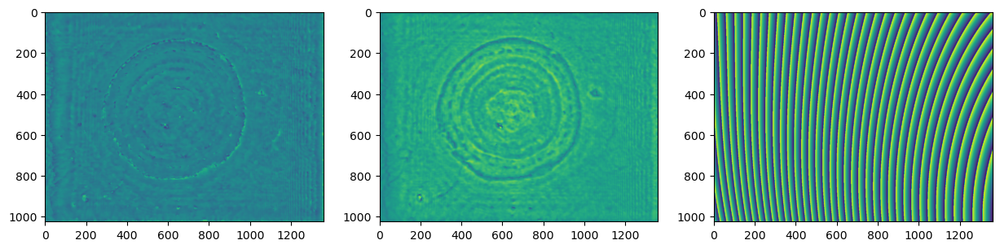

501 0.13814329527033584
502 0.14259117002655514
503 0.14798053916889425
504 0.1468116307033977
505 0.14200462162026262
506 0.13871547298849546
507 0.14314916940720893
508 0.1407421881718663
509 0.14385361564205337
510 0.1469192482188401
511 0.13823084020011608
512 0.1414310390233401
513 0.14625455072641233
514 0.14144537123723394
515 0.14273051785689708
516 0.14391939288976258
517 0.13948141270406633
518 0.14173478724276325
519 0.14374409287581766
520 0.13943875152611723
521 0.1411309666837619
522 0.14201708948485975
523 0.1413776231670186
524 0.14502676447875215
525 0.1452375423018027


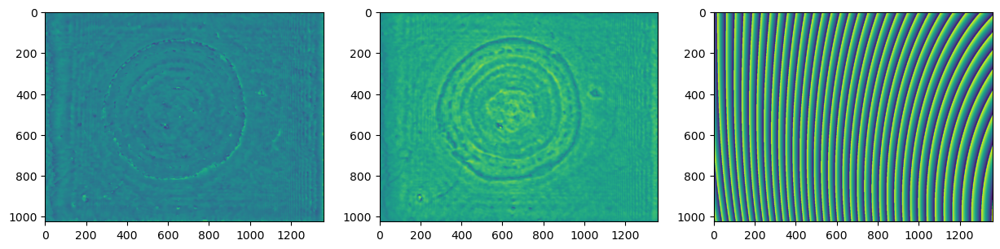

526 0.14113275888135807
527 0.13926630875259038
528 0.13981098151323473
529 0.13928568347497516
530 0.14310670830733951
531 0.14769379171134037
532 0.14145084659444052
533 0.1384071997134173
534 0.14055226462347134
535 0.14117775101145058
536 0.1428380466058144
537 0.1395817008879321
538 0.1436559715842369
539 0.148433135780723
540 0.14089202133123307
541 0.13695970564327808
542 0.1365363797616815
543 0.13993574448812857
544 0.14092047188499435
545 0.14478397606699023
546 0.13971970628386898
547 0.13909151251362883
548 0.13912987492655793
549 0.14044232573198698
550 0.14412672560179368


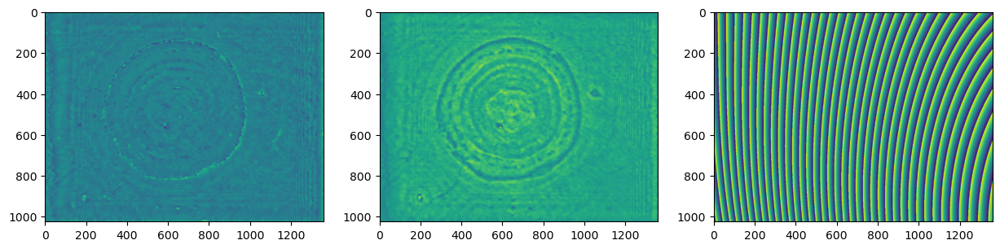

551 0.14453762065738895
552 0.13956492928156192
553 0.13791457793821732
554 0.13849746470684754
555 0.14086306829702797
556 0.14207410051777555
557 0.14280927305407523
558 0.1388760901715224
559 0.13845431546663856
560 0.13710649514658624
561 0.1381980349540612
562 0.1408183418969971
563 0.14245552234251635
564 0.14485517043270113
565 0.14073498893153405
566 0.1404381822344556
567 0.14219919809035425
568 0.1365480977653542
569 0.13826836844895335
570 0.14037484683930182
571 0.1371942433478463
572 0.138316189239142
573 0.1412108937703895
574 0.14405495485123399
575 0.1413126478477677


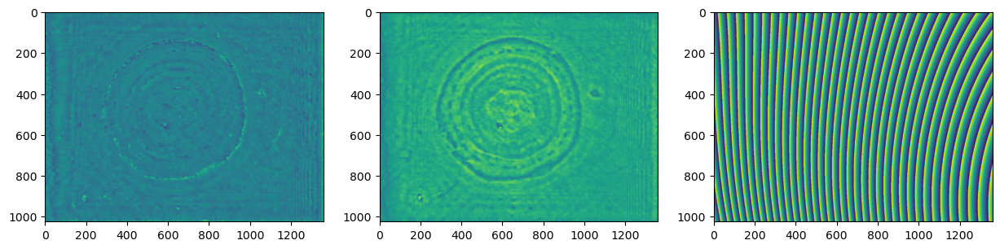

576 0.13956572096174724
577 0.13769993659659285
578 0.1359919125964939
579 0.13702808040294534
580 0.14077860874838008
581 0.1482111016268166
582 0.13819671781086318
583 0.1386960362802085
584 0.14391144607160164
585 0.138967857776389
586 0.13826666210538766
587 0.1363012766989982
588 0.13792706816640404
589 0.14176155379952243
590 0.13706602308214635
591 0.13553029067542094
592 0.13640285625594806
593 0.13976993251849323
594 0.13763428562315383
595 0.13918174389277546
596 0.1475932429422615
597 0.13988288608600558
598 0.1366536952396629
599 0.14246851395893578
600 0.14260030456039408


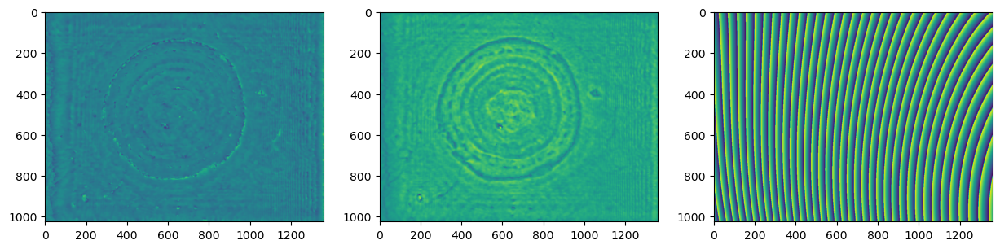

In [30]:
epochs = 601
loss_arr = []


for itr in range(epochs):

    optimizer.zero_grad()
    # optimizer_proc.zero_grad()

    obj = obj_amp*torch.exp(1j*obj_phase)
    
    wave_phase = ((A)@coeffs).reshape(1024, 1360)
    wave = torch.exp(1j*wave_phase)
    
    wave_op = wave*obj

    wave_obj.wavefield(wave_op.T)
    dist = torch.tensor(155.003) # mm
    wave_at_img = wave_obj.propogate(dist)
    wave_z = torch.angle(wave_at_img)
    wave_z += cons
    loss_phase = loss_fn(wave_z, target_phase)/(1024*1360)
    loss_amp = loss_fn(torch.abs(wave_at_img), target_abs)/(1024*1360)

    loss = 0.9*(loss_amp + loss_phase) + 0.5*(total_variation_loss(wave_z, 0.1) + total_variation_loss(torch.abs(wave_at_img), 0.1))

    # proc = model(obj_phase.unsqueeze(0).unsqueeze(0)).squeeze()
    # loss_proc = 0.9*l2_loss(proc, obj_phase) + total_variation_loss(proc, 0.1)

    loss.backward()
    # loss_proc.backward()
    
    optimizer.step()
    # optimizer_proc.step()

    loss_arr.append(loss.item())
    print(itr, loss_arr[-1])

    if (itr) % 25 == 0:

        fig, axs = plt.subplots(1, 3, figsize=(15, 8))

        axs[0].imshow(obj_phase.detach())
        # axs[1].imshow(proc.detach())
        axs[1].imshow(obj_amp.detach())
        axs[2].imshow(torch.angle(wave.detach()))

        plt.show()

In [31]:
dist, cons.grad, coeffs.grad, coeffs

(tensor(155.0030),
 tensor(-8.1315e-20),
 tensor([[-1.3892e-03],
         [ 6.9919e-03],
         [-1.9140e-03],
         [ 9.3743e-04],
         [ 7.0099e-04],
         [ 2.2701e-09],
         [-1.1439e-03],
         [ 6.7545e-03],
         [-6.8446e-04],
         [ 2.8049e-03]]),
 tensor([[ -10.3484],
         [-113.7364],
         [ -13.3358],
         [   6.0040],
         [  11.2231],
         [-130.2368],
         [   2.2527],
         [   5.8713],
         [   0.5827],
         [   2.8902]], requires_grad=True))

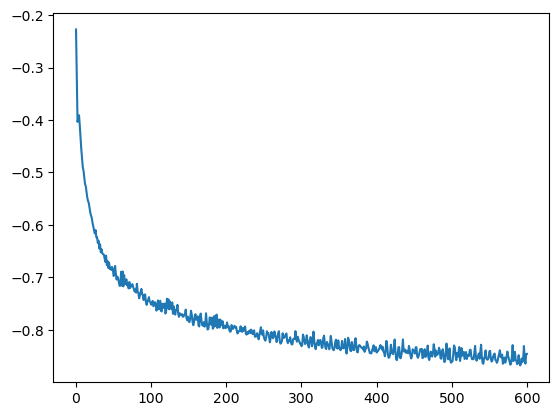

In [32]:
plt.plot(np.log10(loss_arr))

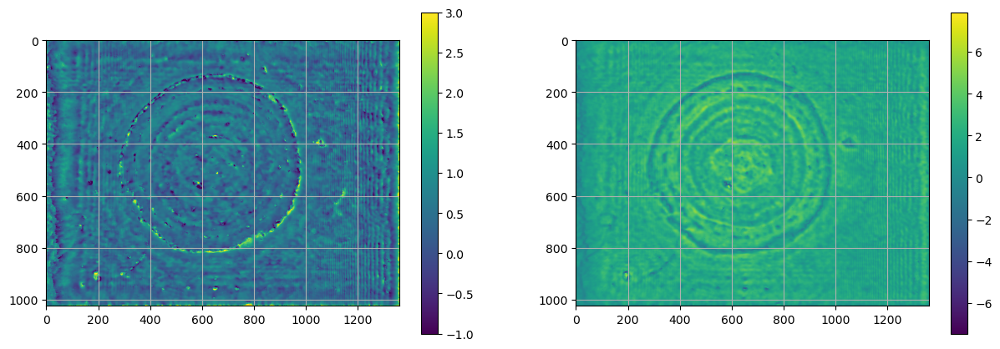

In [33]:
fig, axs = plt.subplots(1, 2, figsize=(15, 5))

cm1 = axs[1].imshow(obj_amp.detach())
cm0 = axs[0].imshow(obj_phase.detach(), vmin=-1, vmax=3)

fig.colorbar(cm0, ax=axs[0])
fig.colorbar(cm1, ax=axs[1])

axs[0].grid()
axs[1].grid()

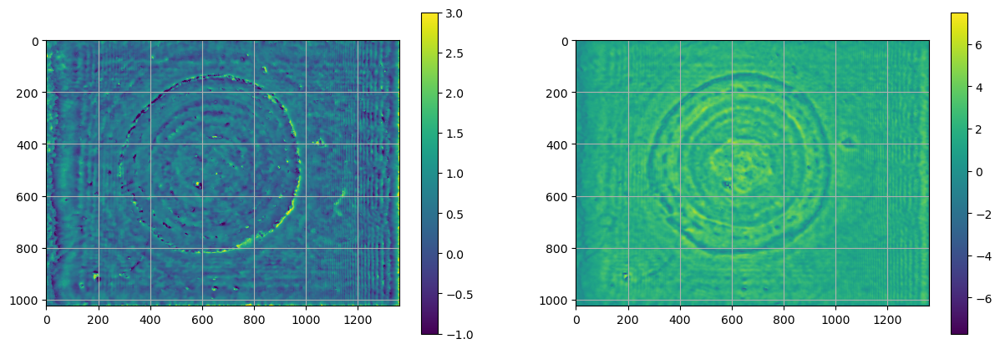

In [20]:
fig, axs = plt.subplots(1, 2, figsize=(15, 5))

cm1 = axs[1].imshow(obj_amp.detach())
cm0 = axs[0].imshow(obj_phase.detach(), vmin=-1, vmax=3)

fig.colorbar(cm0, ax=axs[0])
fig.colorbar(cm1, ax=axs[1])

axs[0].grid()
axs[1].grid()

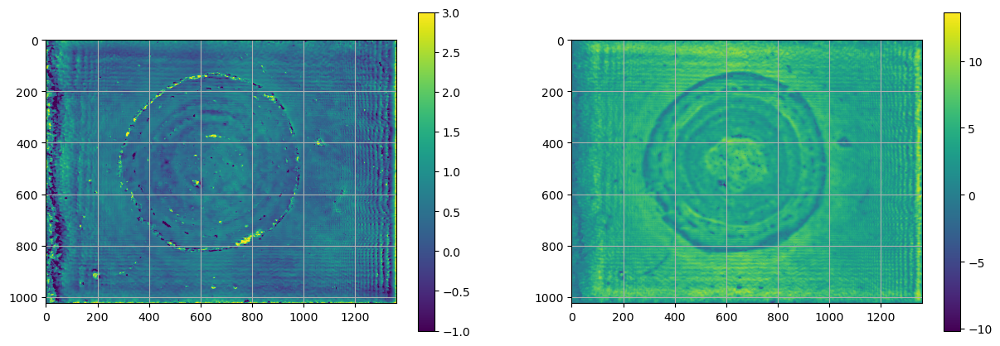

In [180]:
fig, axs = plt.subplots(1, 2, figsize=(15, 5))

cm1 = axs[1].imshow(obj_amp.detach())
cm0 = axs[0].imshow(obj_phase.detach(), vmin=-1, vmax=3)

fig.colorbar(cm0, ax=axs[0])
fig.colorbar(cm1, ax=axs[1])

axs[0].grid()
axs[1].grid()

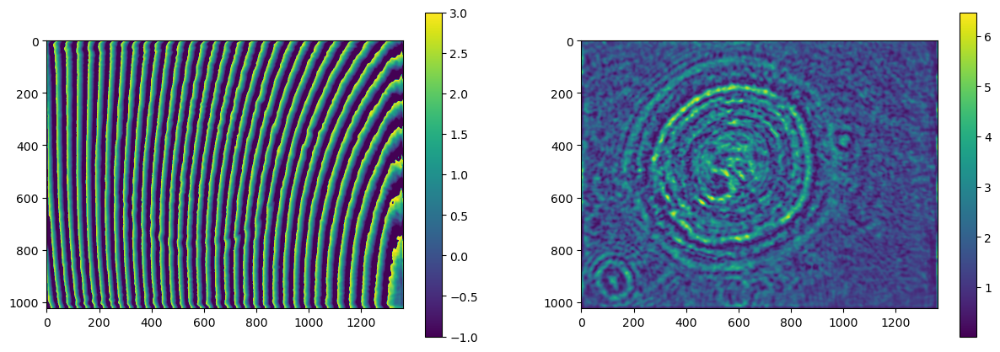

In [34]:
fig, axs = plt.subplots(1, 2, figsize=(15, 5))

cm1 = axs[1].imshow(torch.abs(wave_at_img).T.detach())
cm0 = axs[0].imshow(torch.angle(wave_at_img).T.detach(), vmin=-1, vmax=3)

fig.colorbar(cm0, ax=axs[0])
fig.colorbar(cm1, ax=axs[1])

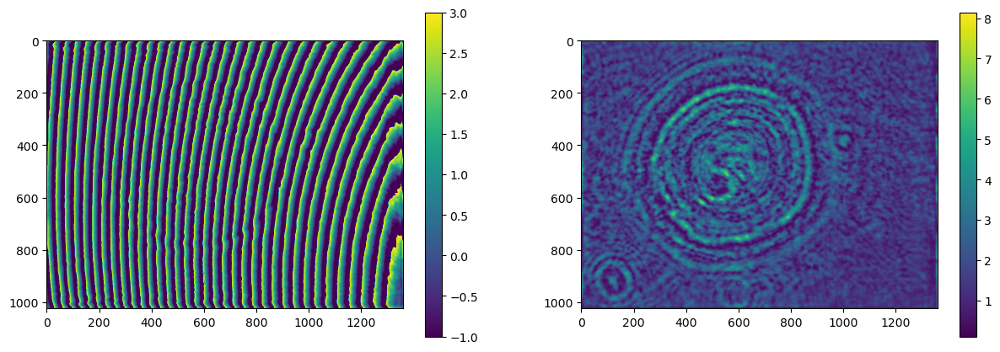

In [21]:
fig, axs = plt.subplots(1, 2, figsize=(15, 5))

cm1 = axs[1].imshow(torch.abs(wave_at_img).T.detach())
cm0 = axs[0].imshow(torch.angle(wave_at_img).T.detach(), vmin=-1, vmax=3)

fig.colorbar(cm0, ax=axs[0])
fig.colorbar(cm1, ax=axs[1])

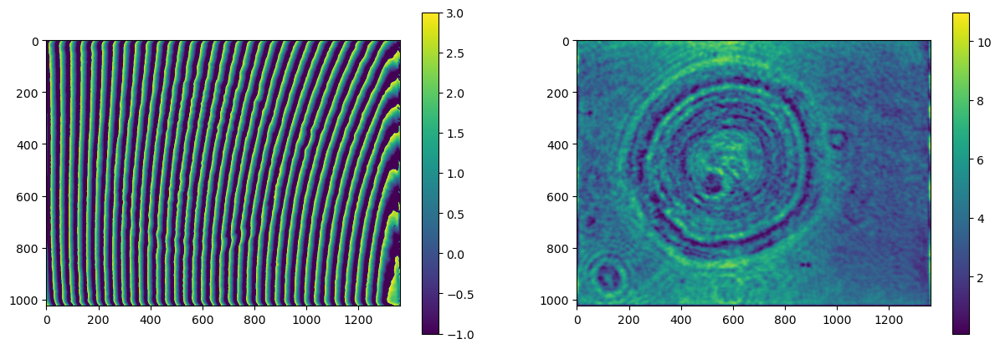

In [178]:
fig, axs = plt.subplots(1, 2, figsize=(15, 5))

cm1 = axs[1].imshow(torch.abs(wave_at_img).T.detach())
cm0 = axs[0].imshow(torch.angle(wave_at_img).T.detach(), vmin=-1, vmax=3)

fig.colorbar(cm0, ax=axs[0])
fig.colorbar(cm1, ax=axs[1])

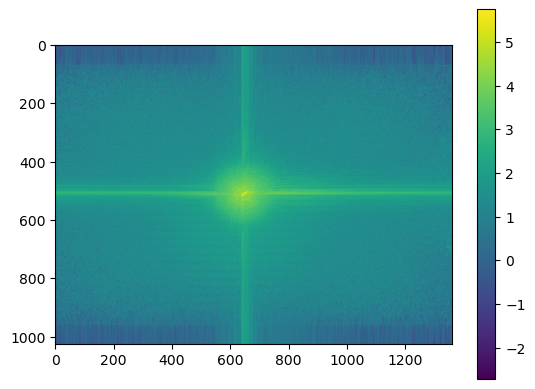

In [22]:
plt.imshow(np.log10(torch.abs(torch.fft.fftshift(torch.fft.fft2(wave_at_img.detach())))).T)
plt.colorbar()

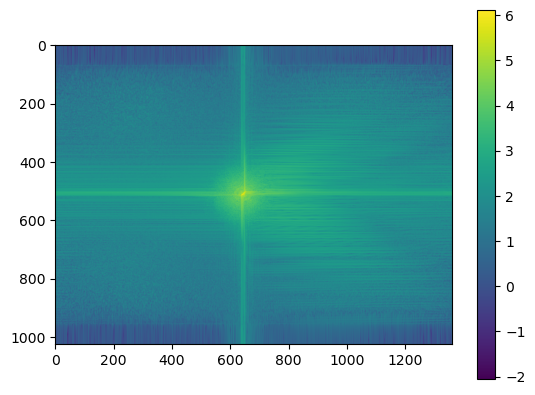

In [172]:
plt.imshow(np.log10(torch.abs(torch.fft.fftshift(torch.fft.fft2(wave_at_img.detach())))).T)
plt.colorbar()

tensor([[ -12.7241],
        [-114.5435],
        [ -12.9551],
        [   4.7421],
        [   6.8633],
        [-118.1326],
        [   2.3889],
        [   2.4276],
        [   1.5576],
        [   3.9442]], requires_grad=True)

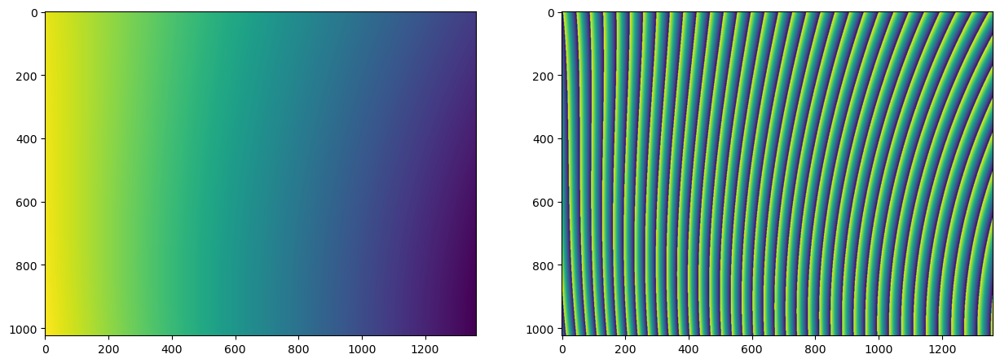

In [173]:
fig, axs = plt.subplots(1, 2, figsize=(15, 8))

axs[1].imshow(torch.angle(wave).detach())
axs[0].imshow(wave_phase.detach())

coeffs

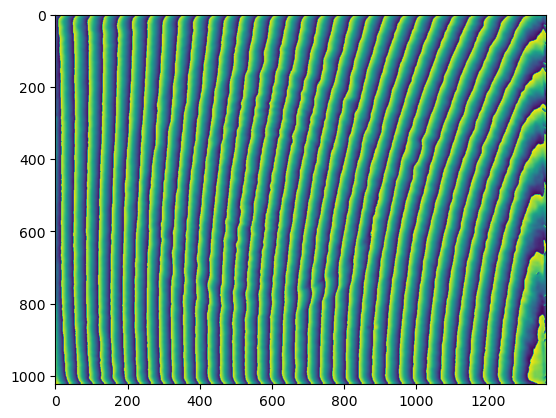

In [174]:
plt.imshow(wave_z.detach().T)

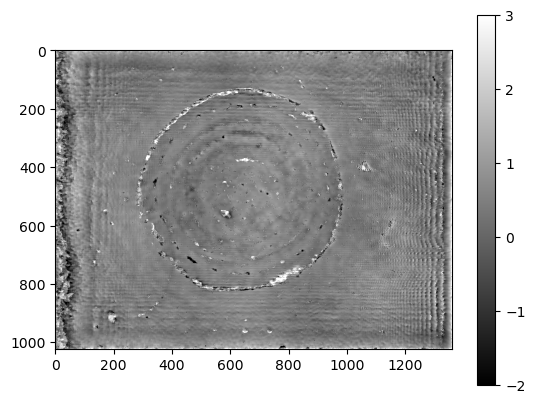

In [175]:
plt.imshow((obj_phase.detach().numpy()), cmap='gray', vmin=-2, vmax=3)
plt.colorbar()